# Resources
* sentinalsat Python API: [ https://sentinelsat.readthedocs.io/en/stable/api_overview.html#quickstart ]
* Planet Intro : [ https://www.kaggle.com/robinkraft/getting-started-with-the-data-now-with-docs ] 
* Radiant Earth Bootcamp :[ https://github.com/RadiantMLHub/ml4eo-bootcamp-2021 ]
* Radiant Earth : [ https://github.com/radiantearth ]
* Sentinel sat api : https://buildmedia.readthedocs.org/media/pdf/sentinelsat/master/sentinelsat.pdf
* https://eos.com/find-satellite/sentinel-2/

In [1]:
!pip install sentinelsat --quiet

In [2]:
#general
import os
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon
import gc


#geospatial
import rasterio 
from rasterio.plot import show
import folium
import geopandas as gpd

#query data 
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt

**Area of Interest**

In [3]:
# loading area of interest coordinates

with open('../input/pune-coordinates/bounding_polygons.pkl','rb') as f:
    coord_dict=pickle.load(f)

aoi=Polygon(list(coord_dict['pune'].values()))
aoi_rural=Polygon(list(coord_dict['pune_rural'].values()))
aoi_urban=Polygon(list(coord_dict['pune_urban'].values()))

# Download data from Copernicus

In [4]:
# register a username on copernicus open hub and save the username password credential(in kaggle secrets for retrieval)
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()


secret_value_0 = user_secrets.get_secret("sentinel_pass")        # retrieve username saved in Kaggle Secrets
secret_value_1 = user_secrets.get_secret("sentinel_username")    # retrieve password saved in Kaggle Secrets

user=secret_value_1
password=secret_value_0

#
api = SentinelAPI(user,
                  password,
                 'https://scihub.copernicus.eu/dhus') # aunnthenticate username & password

# Downloading Sentinel 2 Image 

In [5]:
products_1 = api.query(aoi,                              # query data with following params
                     date = ('20211001', '20221201'),
                     platformname = 'Sentinel-2',
                     processinglevel = 'Level-2A',
                     cloudcoverpercentage = (0,10))

In [6]:
products_gdf = api.to_geodataframe(products_1) # conv data to dataframe
products_gdf_sorted = products_gdf.sort_values(['cloudcoverpercentage'], ascending=[True]) #sort according to cloud cover
products_gdf_sorted_1=products_gdf_sorted.head(2)

products_gdf_sorted.head(2)  # check metadat of products

,title,link,link_alternative,link_icon,summary,ondemand,generationdate,beginposition,endposition,ingestiondate,...,producttype,platformidentifier,orbitdirection,platformserialidentifier,processinglevel,datastripidentifier,granuleidentifier,identifier,uuid,geometry
a1052729-65d5-45ef-a536-136c409445b1,S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2022-01-29T05:30:49.024Z, Instrument: MS...",false,2022-01-29 08:30:24,2022-01-29 05:30:49.024,2022-01-29 05:30:49.024,2022-01-29 11:25:23.357,...,S2MSI2A,2017-013A,DESCENDING,Sentinel-2B,Level-2A,S2B_OPER_MSI_L2A_DS_VGS1_20220129T083024_S2022...,S2B_OPER_MSI_L2A_TL_VGS1_20220129T083024_A0255...,S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_2...,a1052729-65d5-45ef-a536-136c409445b1,"MULTIPOLYGON (((73.11113 17.99092, 74.14799 17..."
783948e1-a0c3-4531-9507-985babac83a7,S2B_MSIL2A_20220119T053139_N0301_R105_T43QDA_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2022-01-19T05:31:39.024Z, Instrument: MS...",false,2022-01-19 08:09:13,2022-01-19 05:31:39.024,2022-01-19 05:31:39.024,2022-01-19 10:03:34.653,...,S2MSI2A,2017-013A,DESCENDING,Sentinel-2B,Level-2A,S2B_OPER_MSI_L2A_DS_VGS1_20220119T080913_S2022...,S2B_OPER_MSI_L2A_TL_VGS1_20220119T080913_A0254...,S2B_MSIL2A_20220119T053139_N0301_R105_T43QDA_2...,783948e1-a0c3-4531-9507-985babac83a7,"MULTIPOLYGON (((74.05505 17.99783, 75.09219 18..."


**Downloading the raster with the least cloud cover**

In [7]:
# api.trigger_offline_retrieval(idx)
product_info = api.get_product_odata(products_gdf_sorted_1.uuid[0])  #get product info 

if product_info['Online']:   #download 
    api.download(products_gdf_sorted_1.uuid[0], directory_path='./')

MD5 checksumming:   0%|          | 0.00/1.20G [00:00<?, ?B/s]

In [8]:
!ls

S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.zip
__notebook_source__.ipynb


In [13]:
!unzip ./S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.zip  # unzipping raster 

Archive:  ./S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.zip
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/
 extracting: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/manifest.safe  
 extracting: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/INSPIRE.xml  
 extracting: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/MTD_MSIL2A.xml  
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/GRANULE/
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/AUX_DATA/
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/HTML/
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/rep_info/
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/DATASTRIP/
   creating: S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/GRANULE/L2A_T43QCA_A025585_20220129T053

**We can see that the unzipped data has Images in 3 Resoultions(10m,20m,and 60m)**

**Chekcing the Images in 20 Meters resolution**

In [24]:
!ls ./S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/GRANULE/L2A_T43QCA_A025585_20220129T053901/IMG_DATA/R20m

T43QCA_20220129T053049_AOT_20m.jp2  T43QCA_20220129T053049_B07_20m.jp2
T43QCA_20220129T053049_B01_20m.jp2  T43QCA_20220129T053049_B11_20m.jp2
T43QCA_20220129T053049_B02_20m.jp2  T43QCA_20220129T053049_B12_20m.jp2
T43QCA_20220129T053049_B03_20m.jp2  T43QCA_20220129T053049_B8A_20m.jp2
T43QCA_20220129T053049_B04_20m.jp2  T43QCA_20220129T053049_SCL_20m.jp2
T43QCA_20220129T053049_B05_20m.jp2  T43QCA_20220129T053049_TCI_20m.jp2
T43QCA_20220129T053049_B06_20m.jp2  T43QCA_20220129T053049_WVP_20m.jp2


In [43]:
# the 20 m resolution image are in this dir 
rgb_nir_dir = './S2B_MSIL2A_20220129T053049_N0400_R105_T43QCA_20220129T083024.SAFE/GRANULE/L2A_T43QCA_A025585_20220129T053901/IMG_DATA/R20m/'

def scale(band):
    '''scale image by maximum value s to be in range of (0,1)'''
    return band / float(np.max(band))

b = scale(rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B02_20m.jp2').read().reshape((5490,5490,1))) # blue 
g = scale(rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B03_20m.jp2').read().reshape((5490,5490,1))) # green
r = scale(rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B04_20m.jp2').read().reshape((5490,5490,1))) # red 
nir = scale(rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B8A_20m.jp2').read().reshape((5490,5490,1)))  # near infrared 
swir1 = scale(rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B11_20m.jp2').read().reshape((5490,5490,1)))  # short wave infrared 
swir2 = scale(rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B12_20m.jp2').read().reshape((5490,5490,1)))  # short wave infrared 2

**Some Band Metadata**

In [31]:
b1= rasterio.open(rgb_nir_dir + 'T43QCA_20220129T053049_B02_20m.jp2')
b1.bounds # image bounds

BoundingBox(left=300000.0, bottom=1990200.0, right=409800.0, top=2100000.0)

In [33]:
print('file size for 20m resolution blue band is {} MB'.format(os.path.getsize(rgb_nir_dir + 'T43QCA_20220129T053049_B02_20m.jp2')/1024**2))

file size for 20m resolution blue band is 31.805809020996094 MB


In [34]:
# metadata 
b1.profile

{'driver': 'JP2OpenJPEG', 'dtype': 'uint16', 'nodata': None, 'width': 5490, 'height': 5490, 'count': 1, 'crs': None, 'transform': Affine(20.0, 0.0, 300000.0,
       0.0, -20.0, 2100000.0), 'blockxsize': 640, 'blockysize': 640, 'tiled': True}

In [35]:
b1.width,b1.height           #image height and width

(5490, 5490)

In [36]:
print(b1.transform) #image transforms 

del b1;gc.collect()

| 20.00, 0.00, 300000.00|
| 0.00,-20.00, 2100000.00|
| 0.00, 0.00, 1.00|


8728

# Visualizing Images

**Create a RGB Image**

**Saving a RGB Image**

In [ ]:
# save a RGB Image 

# with rasterio.open('RGB.tiff','w',driver='Gtiff', width=b1.width, height=b1.height, 
#               count=3,crs=b1.crs,transform=b1.transform, dtype=b1.dtypes[0]) as rgb:         
#     rgb.write(b1.read(1),1) 
#     rgb.write(b2.read(1),2) 
#     rgb.write(b3.read(1),3) 
#     rgb.close()
    
    
    
# rgb=rasterio.open('./RGB.tiff')

25

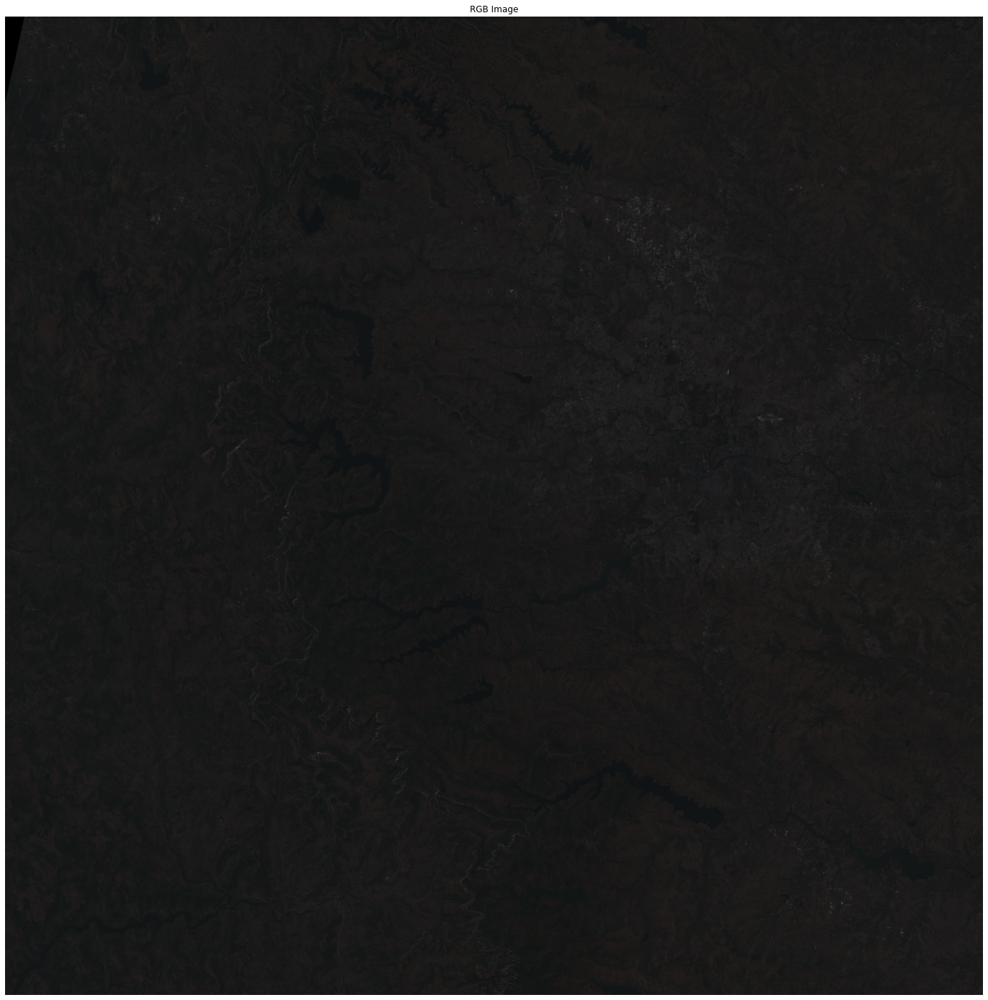

In [38]:
rgb = np.dstack((r,g,b))
plt.subplots(figsize=(25,25))
plt.title('RGB Image')
plt.axis('off')
plt.imshow(rgb,cmap='gist_earth')
del rgb ; gc.collect()

**False Color Image(replace red band by Near Infrared)**

5312

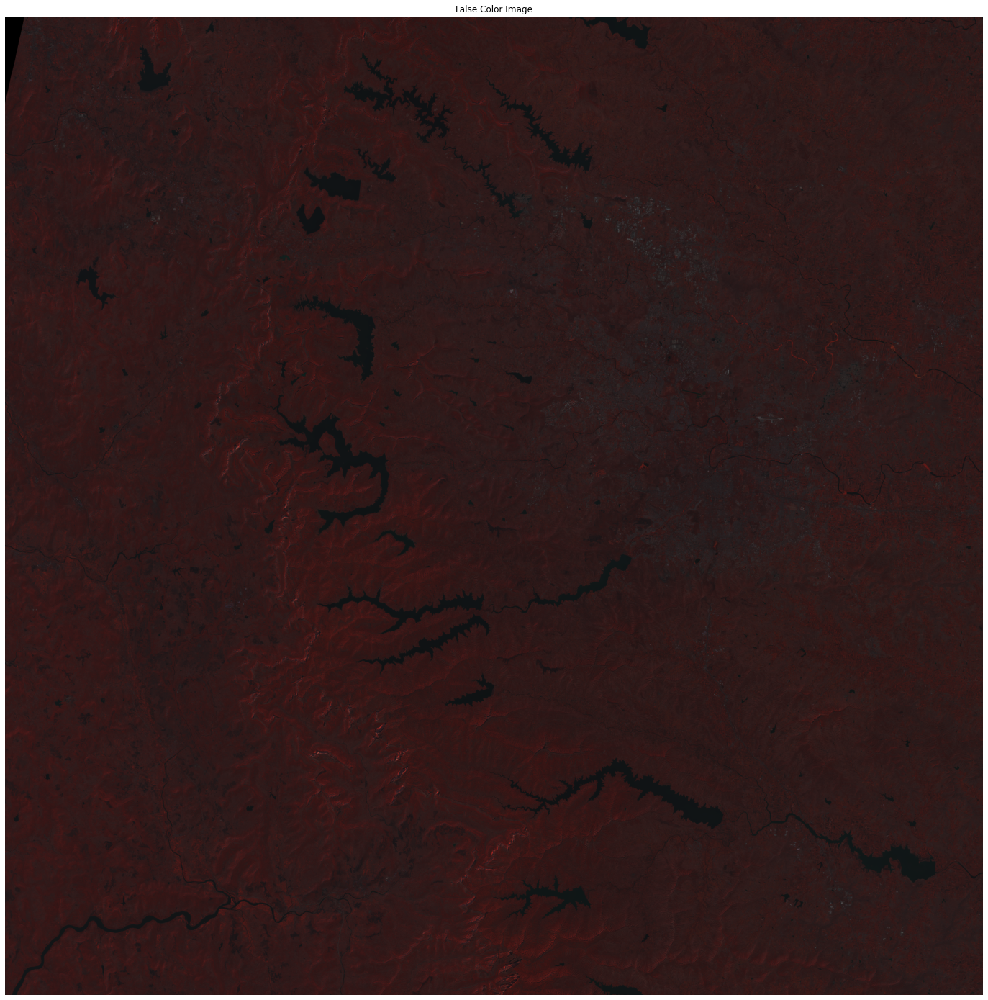

In [125]:
fc = np.dstack((nir,g,b))
plt.subplots(figsize=(25,25))
plt.title('False Color Image')
plt.axis('off')
plt.imshow(fc,cmap='gist_earth')
del fc ; gc.collect()

# Remote Sensing Indices for segmenting Landcover


**spectral reflectance curve**
![](https://www.researchgate.net/profile/Paria-Ettehadi/publication/330994618/figure/fig2/AS:724682999349248@1549789299321/Spectral-reflectance-curves-of-different-land-cover-use-LCU-types-according-to-the.png)

**Calculate Normalized Difference Vegetation Index :**

    NDVI = (NIR - RED) / (NIR + RED) , where NIR is Near Infrared Band
    
    
**We can see in this Image that most of the forests(with high NDVI) lie along the mountainous ranges that run along the west. The whitish region corresponds to water bodies and bare and urban regions, while the slightly green ones are less dense vegetations. **

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


5317

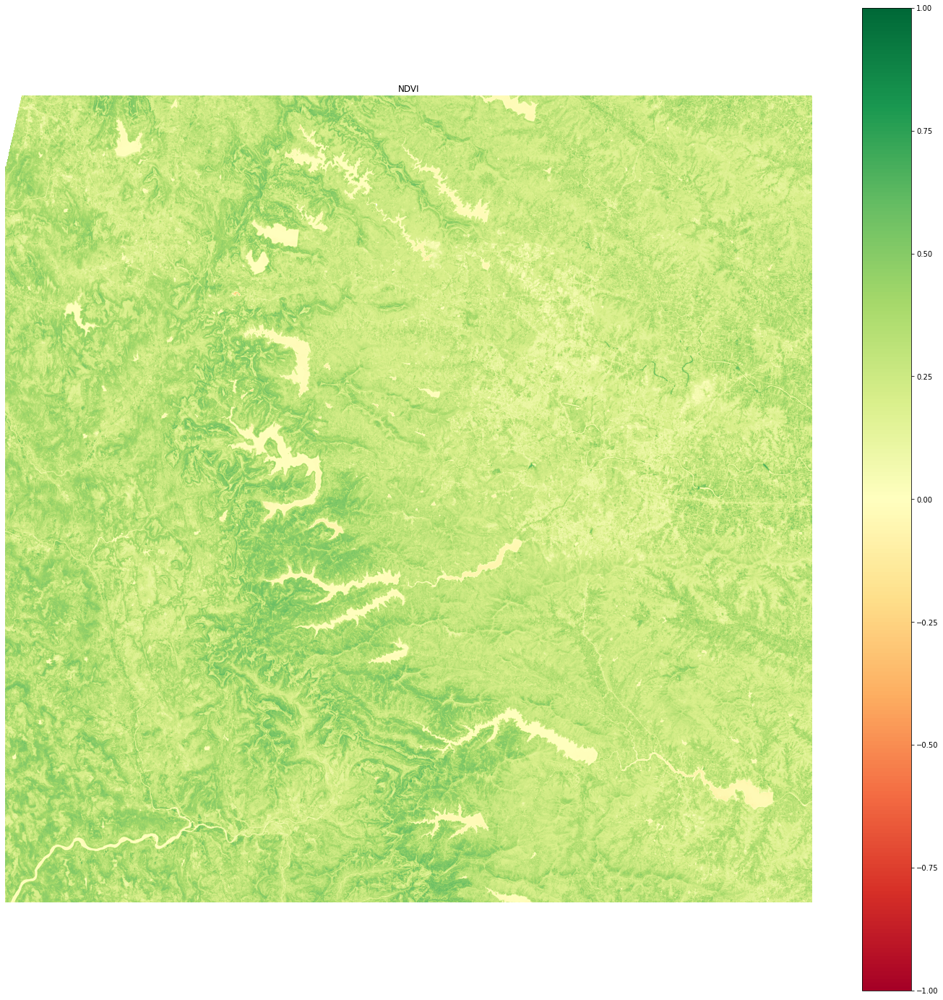

In [110]:

#NDVI
ndvi = (nir.astype(float)-r.astype(float))/(nir.astype(float)+r.astype(float))
plt.subplots(figsize=(25,25))
plt.axis('off')
plt.imshow(ndvi,cmap='RdYlGn')          # 
plt.colorbar()                               # show colorbar
plt.title('NDVI')

del ndvi ; gc.collect()

# Normalized Difference water Index

    NDWI(modified) = Green - Short Wave Infrared / (Green + Short Wave Infrared)
    
**In this Image, we can see the water bodies in the area highlighted with deep blue.**

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


5317

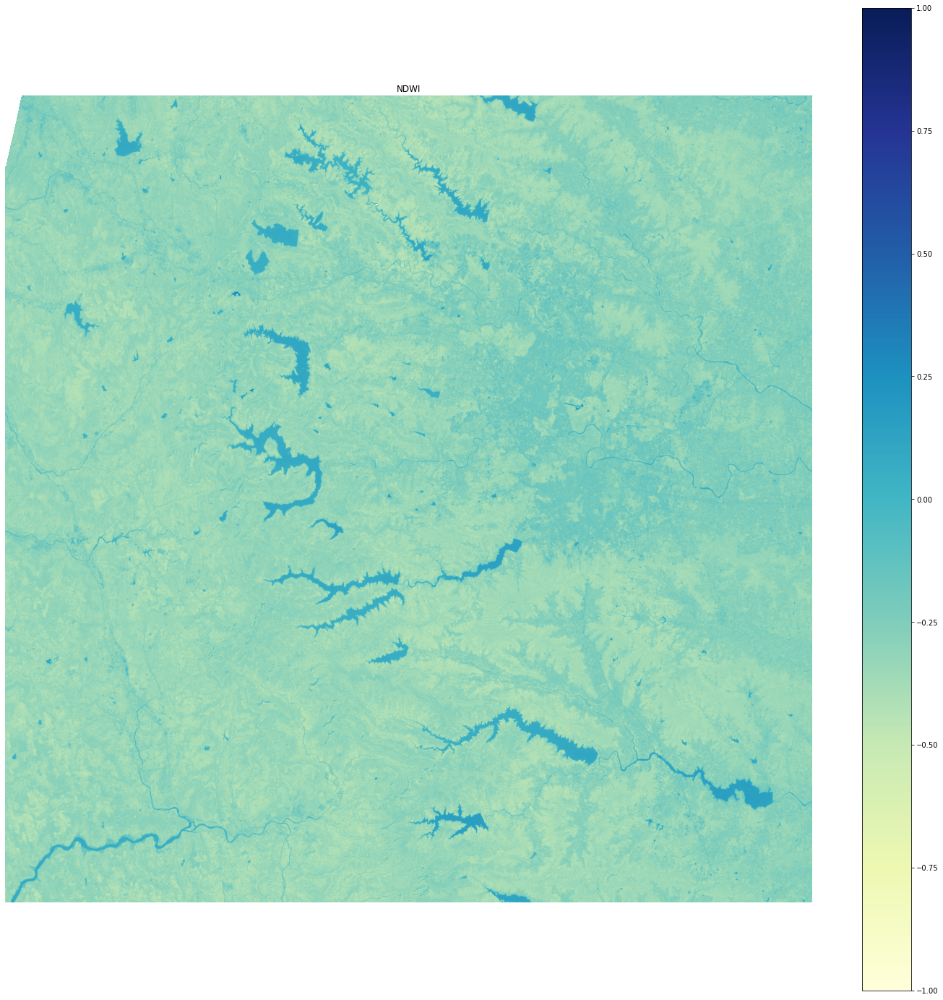

In [57]:

#NDWI
ndwi = (g.astype(float)-swir1.astype(float))/(g.astype(float)+swir1.astype(float))
plt.subplots(figsize=(25,25))
plt.axis('off')
plt.imshow(ndwi,cmap='YlGnBu')          
plt.colorbar()                               
plt.title('NDWI')

del ndwi ; gc.collect()

# Build Up Area 
    NDBI = SWIR - NIR / SWIR + NIR 
    
**In this Image, the Buildup/Bare Region is highlighted (along with some traces of water bodies)**

5322

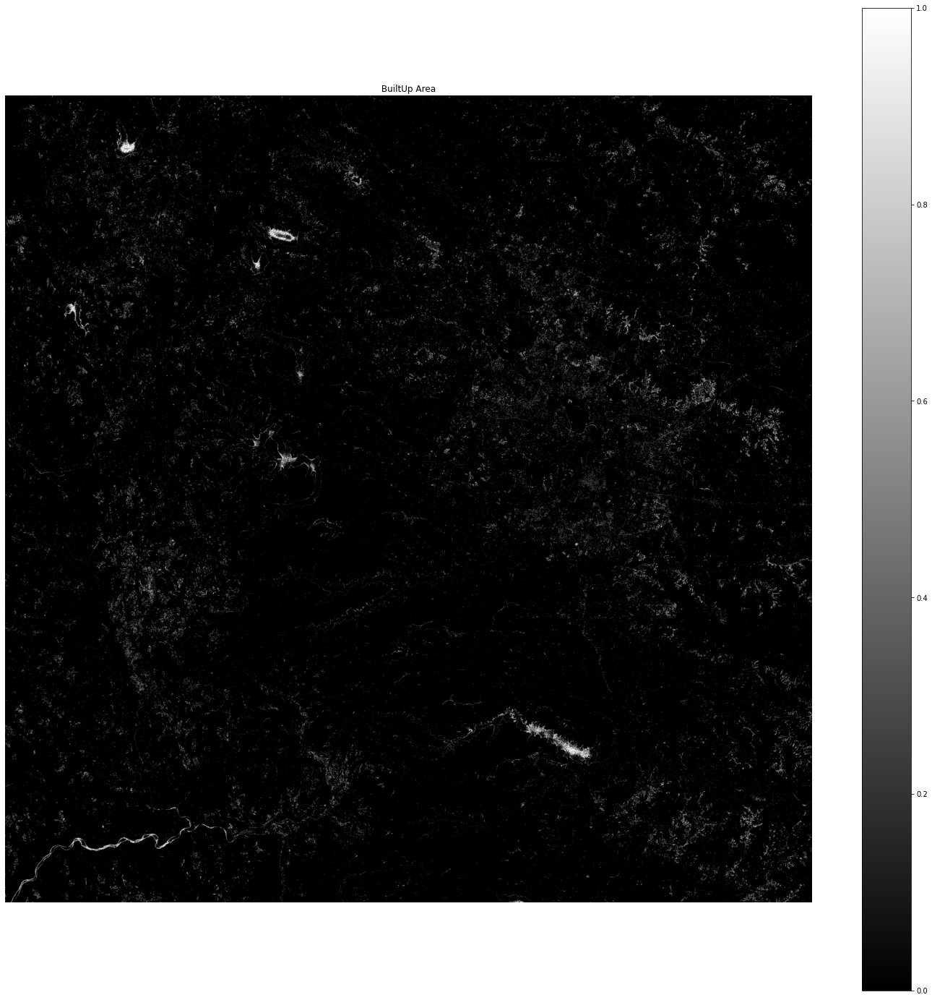

In [140]:

#NDBI 
ndbi = (swir1.astype(float)-nir.astype(float))/(swir1.astype(float)+nir.astype(float) + 1e-7)
ndvi = (nir.astype(float)-r.astype(float))/(nir.astype(float)+r.astype(float) + 1e-7)

bu = ndbi - ndvi


bu = np.where(bu>0.02,-0.2,bu)  # clip larger values(as they are from water bodies)
# bu = np.where(bu<-0.2,-0.2,bu)  # clip smaller values

plt.subplots(figsize=(25,25))
plt.axis('off')


thresh= 1e-3
plt.imshow(bu>thresh,cmap='gray')          
plt.colorbar()                               
plt.title(' BuiltUp Area ')

del ndbi ,bu,ndvi; gc.collect()